## Define the model

In [1]:
from keras.applications.mobilenet import MobileNet
from keras.preprocessing import image
from keras.applications.mobilenet import preprocess_input

from keras.models import Model, Sequential, save_model, load_model
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, Flatten, Activation, Add, Lambda, Concatenate
from keras.layers.normalization import BatchNormalization
from keras.layers.core import Dropout
from keras import optimizers
import keras.backend as K
import numpy as np

Using TensorFlow backend.


In [2]:
aesthetic_fea = Input(shape=(1024, ))
semantic_fea = Input(shape=(1024, ))
merge_fea = Concatenate()([aesthetic_fea, semantic_fea])

x = Dense(1024, activation="selu")(merge_fea)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
    
#output = Dense(1, activation="sigmoid")(x)
output = Dense(1, activation="linear")(x)

dense_model = Model(inputs=[aesthetic_fea, semantic_fea], outputs=output, name="fc_model")
#dense_model.load_weights("./model/ensemble_model.h5")
dense_model.load_weights("./model/ensemble_model_on_regression.h5")

In [3]:
input_shape = (224, 224, 3)

img = Input(shape=input_shape, name="img_input")

semantic_net = MobileNet(input_shape=input_shape, weights='imagenet', include_top=False, pooling='avg')
semantic_net.name = "semantic_mobile_net"
aesthetic_net = MobileNet(input_shape=input_shape, weights=None, include_top=False, pooling='avg')
aesthetic_net.name = "aesthetic_mobile_net"
aesthetic_net.load_weights("./model/aesthetic_mobilenet_on_regression_without_top.h5")

semantic_fea = semantic_net(img)
aesthetic_fea = aesthetic_net(img)

output = dense_model([aesthetic_fea, semantic_fea])

aesthetic_model = Model(inputs=img, outputs=output)

In [4]:
aesthetic_model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
img_input (InputLayer)           (None, 224, 224, 3)   0                                            
____________________________________________________________________________________________________
aesthetic_mobile_net (Model)     (None, 1024)          3228864     img_input[0][0]                  
____________________________________________________________________________________________________
semantic_mobile_net (Model)      (None, 1024)          3228864     img_input[0][0]                  
____________________________________________________________________________________________________
fc_model (Model)                 (None, 1)             2103297     aesthetic_mobile_net[1][0]       
                                                                   semantic_mobile_net[1][0

## Evaluate on real-photos

In [5]:
import os

def load_img_array(imgfile, target_size):
    img = image.load_img(imgfile, target_size=target_size)
    x = image.img_to_array(img)
    x = preprocess_input(x)
    return x

def generate_batch(imglist, batch_size, target_size):
    while True:
        for index in range(0, len(imglist), batch_size):
            if index + batch_size > len(imglist):
                current_batch_size = len(imglist) - index
            else:
                current_batch_size = batch_size
            index_array = imglist[index:index+current_batch_size]

            batch_x = np.zeros((current_batch_size, ) + target_size, dtype=K.floatx())
            #batch_y = np.zeros((current_batch_size, ), dtype=K.floatx())
            for i, imgfile in enumerate(index_array):
                x = load_img_array(imgfile, target_size)
                batch_x[i] = x
            yield batch_x

In [6]:
imgdir = "../dataset/TEST/"
batch_size = 32
imglist = [imgdir + "/" + imgfile for imgfile in os.listdir(imgdir)]

img_probs = aesthetic_model.predict_generator(generate_batch(imglist, batch_size=batch_size, target_size=input_shape), 
                                              steps=np.ceil(len(imglist)*1.0/batch_size).astype(np.int))

In [7]:
%matplotlib inline
from PIL import Image
import matplotlib.pyplot as plt
import random

def Plot(imgfile, title):
    plt.figure()
    
    plt.title(title)
    img = Image.open(imgfile)
    plt.imshow(img)
    plt.axis('off')
    
    plt.show()

assert(len(imglist) == len(img_probs))
img2score = sorted(zip(imglist, img_probs[:, 0]), key=lambda x: x[1], reverse=True)

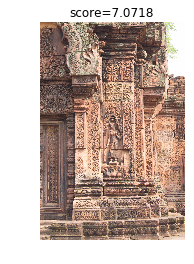

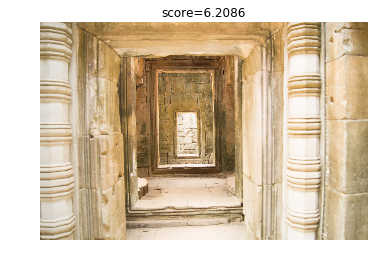

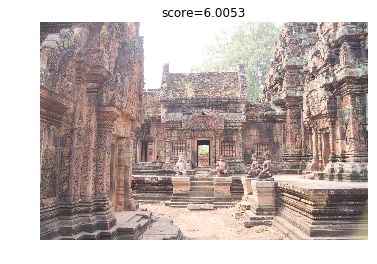

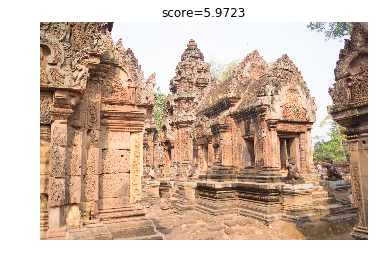

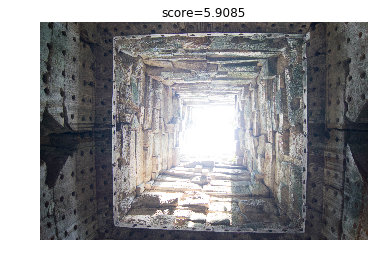

...

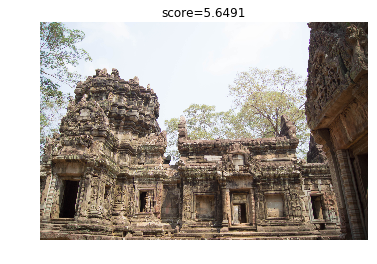

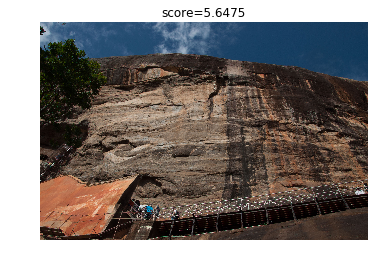

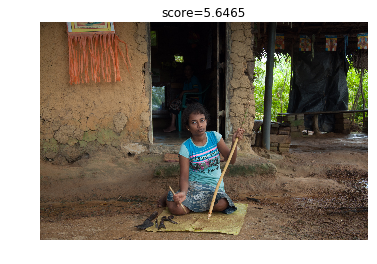

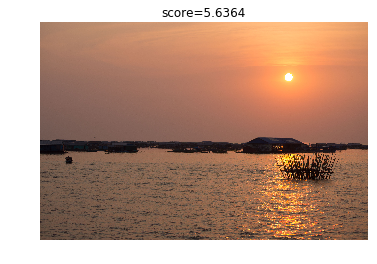

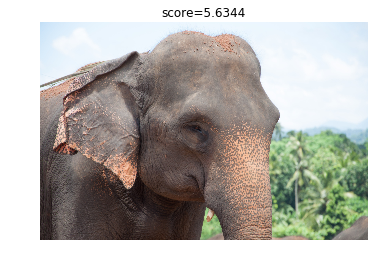

In [8]:
for imgfile, score in img2score[:30]:
    Plot(imgfile, title="score=%.4f"%score)

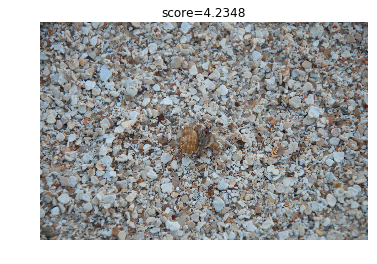

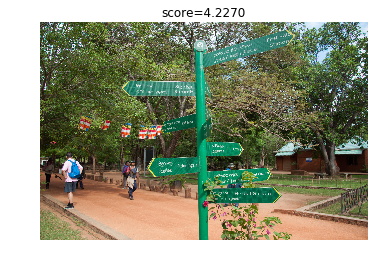

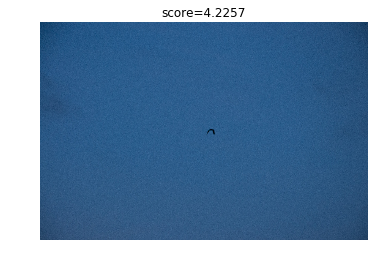

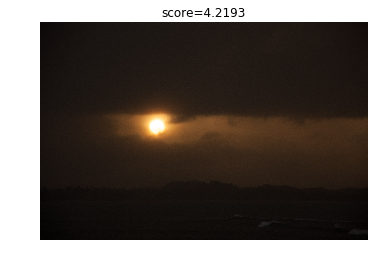

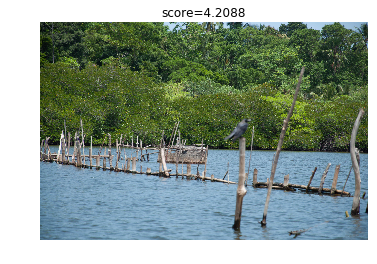

...

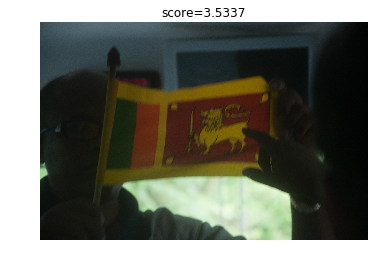

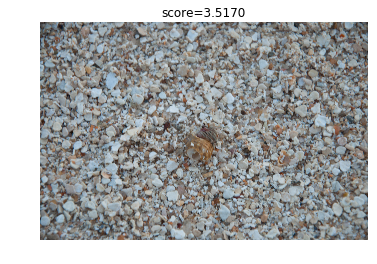

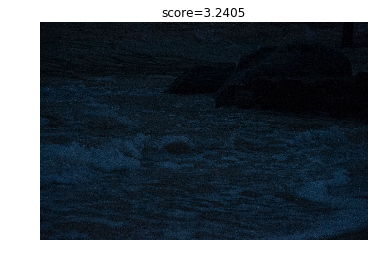

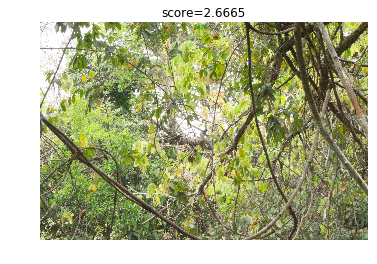

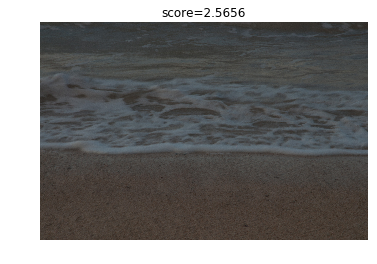

In [9]:
for imgfile, score in img2score[-30:]:
    Plot(imgfile, title="score=%.4f"%score)

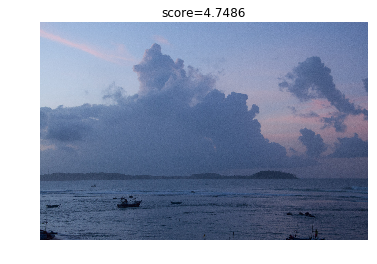

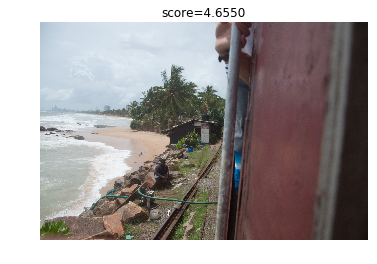

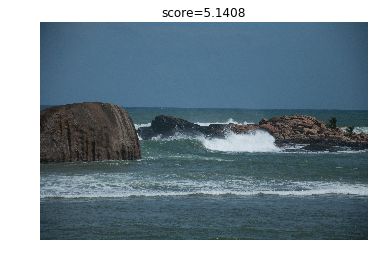

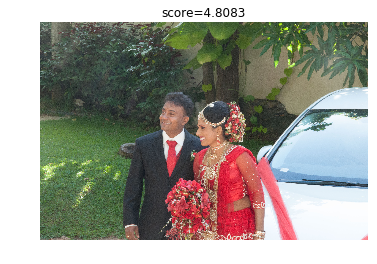

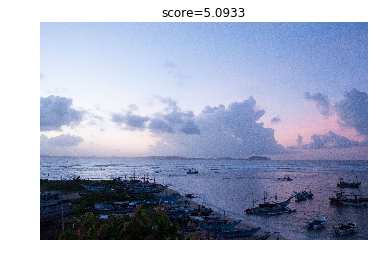

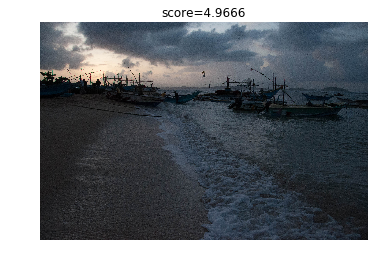

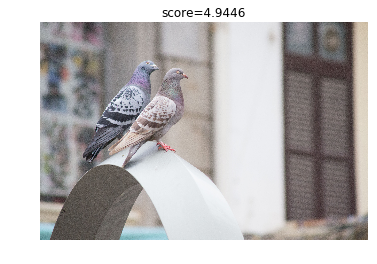

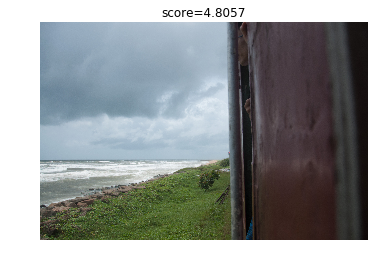

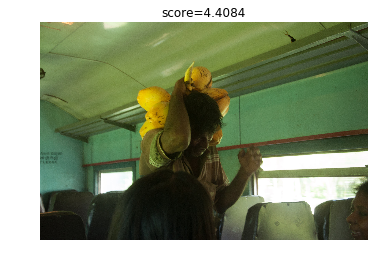

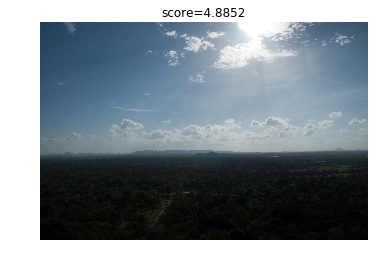

In [11]:
for imgfile, score in random.sample(img2score, 10):
    Plot(imgfile, title="score=%.4f"%score)